In [6]:
import os
import sys
import cv2
from math import pi
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D
import torchvision
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
def pair(t):
    return t if isinstance(t, tuple) else (t, t)

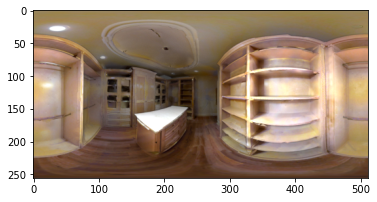

In [7]:
img = cv2.imread('pano4.png', cv2.IMREAD_COLOR)
#img = img.astype(np.float32) / 255
[erp_h, erp_w, _] = img.shape
plt.imshow(img[:,:,[2,1,0]])
plt.show()

In [8]:
img_new = img.astype(np.float32) / 255
img_new = np.transpose(img_new, [2, 0, 1])
img_new = torch.from_numpy(img_new)
img_new = img_new.unsqueeze(0)

In [9]:
height, width = 96, 96
FOV = [90, 90]
FOV = [FOV[0]/360.0, FOV[1]/180.0]
FOV = torch.tensor(FOV, dtype=torch.float32)
PI = math.pi
PI_2 = math.pi * 0.5
PI2 = math.pi * 2
yy, xx = torch.meshgrid(torch.linspace(0, 1, height), torch.linspace(0, 1, width))
screen_points = torch.stack([xx.flatten(), yy.flatten()], -1)
print(screen_points.shape)

torch.Size([9216, 2])


In [11]:


#num_rows = 6
#num_cols = [3, 8, 12, 12, 8, 3]
#phi_centers = [-75, -45, -15, 15, 45, 75]
num_rows = 4
num_cols = [3, 6, 6, 3]
phi_centers = [-67.5, -22.5, 22.5, 67.5]
phi_interval = 180 // num_rows
all_combos = []
erp_mask = []
for i, n_cols in enumerate(num_cols):
    for j in np.arange(n_cols):
        theta_interval = 360 / n_cols
        theta_center = j * theta_interval + theta_interval / 2
        center = [theta_center, phi_centers[i]]
        all_combos.append(center)
        up = phi_centers[i] + phi_interval / 2
        down = phi_centers[i] - phi_interval / 2
        left = theta_center - theta_interval / 2
        right = theta_center + theta_interval / 2
        up = int((up + 90) / 180 * erp_h)
        down = int((down + 90) / 180 * erp_h)
        left = int(left / 360 * erp_w)
        right = int(right / 360 * erp_w)
        mask = np.zeros((erp_h, erp_w), dtype=int)
        mask[down:up, left:right] = 1
        erp_mask.append(mask)
all_combos = np.vstack(all_combos) 
shifts = np.arange(all_combos.shape[0]) * width
shifts = torch.from_numpy(shifts).float()
erp_mask = np.stack(erp_mask)
erp_mask = torch.from_numpy(erp_mask).float()
n_patch = all_combos.shape[0]
print(all_combos)

[[ 60.  -67.5]
 [180.  -67.5]
 [300.  -67.5]
 [ 30.  -22.5]
 [ 90.  -22.5]
 [150.  -22.5]
 [210.  -22.5]
 [270.  -22.5]
 [330.  -22.5]
 [ 30.   22.5]
 [ 90.   22.5]
 [150.   22.5]
 [210.   22.5]
 [270.   22.5]
 [330.   22.5]
 [ 60.   67.5]
 [180.   67.5]
 [300.   67.5]]


In [120]:
center_point = torch.from_numpy(all_combos).float()  # -180 to 180, -90 to 90
center_point[:, 0] = (center_point[:, 0]) / 360  #0 to 1
center_point[:, 1] = (center_point[:, 1] + 90) / 180  #0 to 1


In [121]:
cp = center_point * 2 - 1
cp[:, 0] = cp[:, 0] * PI
cp[:, 1] = cp[:, 1] * PI_2
cp = cp.unsqueeze(1)
convertedCoord = screen_points * 2 - 1
convertedCoord[:, 0] = convertedCoord[:, 0] * PI
convertedCoord[:, 1] = convertedCoord[:, 1] * PI_2
convertedCoord = convertedCoord * (torch.ones(screen_points.shape, dtype=torch.float32) * FOV)
convertedCoord = convertedCoord.unsqueeze(0).repeat(cp.shape[0], 1, 1)
print(cp.shape)
print(convertedCoord.shape)

torch.Size([18, 1, 2])
torch.Size([18, 9216, 2])


In [122]:
x = convertedCoord[:, :, 0]
y = convertedCoord[:, :, 1]

rou = torch.sqrt(x ** 2 + y ** 2)
c = torch.atan(rou)
sin_c = torch.sin(c)
cos_c = torch.cos(c)
lat = torch.asin(cos_c * torch.sin(cp[:, :, 1]) + (y * sin_c * torch.cos(cp[:, :, 1])) / rou)
lon = cp[:, :, 0] + torch.atan2(x * sin_c, rou * torch.cos(cp[:, :, 1]) * cos_c - y * torch.sin(cp[:, :, 1]) * sin_c)
lat_new = lat / PI_2 
lon_new = lon / PI 
lon_new[lon_new > 1] -= 2
lon_new[lon_new<-1] += 2 

In [123]:
print(lon_new.shape, lat_new.shape)
lon_new = lon_new.view(1, n_patch, height, width).permute(0, 2, 1, 3).contiguous().view(height, n_patch*width)
lat_new = lat_new.view(1, n_patch, height, width).permute(0, 2, 1, 3).contiguous().view(height, n_patch*width)
grid = torch.stack([lon_new, lat_new], -1)


torch.Size([18, 9216]) torch.Size([18, 9216])


In [124]:
grid = grid.unsqueeze(0)
persp = F.grid_sample(img_new, grid, mode='bilinear', padding_mode='zeros', align_corners=True)
print(persp.shape)

torch.Size([1, 3, 96, 1728])


(96, 1728, 3)


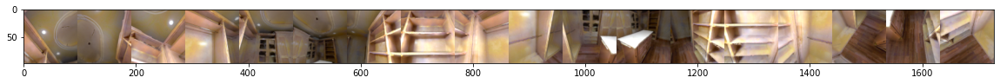

In [125]:
persp_int = persp[0].permute(1, 2, 0).numpy()
persp_int = persp_int * 255
cv2.imwrite('pers.png', persp_int.astype(np.uint8))
print(persp_int.shape)
plt.figure(figsize=(20, 12))
plt.imshow(persp_int[:,:,[2,1,0]].astype(np.uint8), aspect=1)
plt.show()

In [126]:
lat_grid, lon_grid = torch.meshgrid(torch.linspace(-PI_2, PI_2, erp_h), torch.linspace(-PI, PI, erp_w))
lon_grid = lon_grid.float().reshape(1, -1)#.repeat(num_rows*num_cols, 1)
lat_grid = lat_grid.float().reshape(1, -1)#.repeat(num_rows*num_cols, 1) 

cos_c = torch.sin(cp[..., 1]) * torch.sin(lat_grid) + torch.cos(cp[..., 1]) * torch.cos(lat_grid) * torch.cos(lon_grid - cp[..., 0])
new_x = (torch.cos(lat_grid) * torch.sin(lon_grid - cp[..., 0])) / cos_c
new_y = (torch.cos(cp[..., 1])*torch.sin(lat_grid) - torch.sin(cp[...,1])*torch.cos(lat_grid)*torch.cos(lon_grid-cp[...,0])) / cos_c
new_x = new_x / FOV[0] / PI   # -1 to 1
new_y = new_y / FOV[1] / PI_2
print(new_x.shape, new_y.shape)
#new_x[new_x>1] = 0
#new_x[new_x<-1] = 0
#new_y[new_y>1] = 0
#new_y[new_y<-1] = 0

torch.Size([18, 131072]) torch.Size([18, 131072])


In [127]:
new_x = (new_x + 1) * 0.5 * height
new_y = (new_y + 1) * 0.5 * width
new_x = new_x.reshape(n_patch, erp_h, erp_w) 
new_y = new_y.reshape(n_patch, erp_h, erp_w) 

new_x = new_x + shifts.reshape(-1, 1, 1)
print(new_x.min(), new_x.max())
print(new_y.min(), new_y.max())

tensor(-1.5927e+08) tensor(1.5927e+08)
tensor(-1.6294e+08) tensor(1.6294e+08)


In [128]:
#new_x = new_x[15, :, :]
#new_y = new_y[15, :, :]
new_x *= erp_mask
new_y *= erp_mask
print(new_x.shape)
new_x = new_x.sum(0)
new_y = new_y.sum(0)
print(new_x.shape)

torch.Size([18, 256, 512])
torch.Size([256, 512])


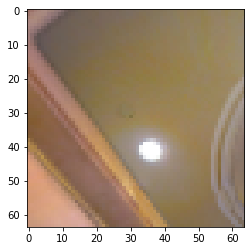

In [129]:
persp_patch = persp[:, :, :64, :64]
persp_patch = persp_patch[0].permute(1, 2, 0).numpy()
persp_patch = persp_patch * 255
plt.imshow(persp_patch[:,:,[2,1,0]].astype(np.uint8), aspect=1)
plt.show()

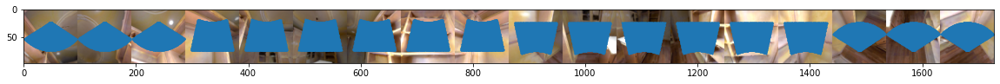

In [130]:
plt.figure(figsize=(20, 12))
plt.imshow(persp_int[:,:,[2,1,0]].astype(np.uint8), aspect=1)
plt.scatter(new_x.flatten(), new_y.flatten(), s=1)
plt.show()

In [131]:
new_x = (new_x / persp.shape[-1] - 0.5) * 2
new_y = (new_y / persp.shape[-2] - 0.5) * 2
print(new_x.min(), new_x.max())
print(new_y.min(), new_y.max())
new_grid = torch.stack([new_x, new_y], -1)
new_grid = new_grid.unsqueeze(0)
img_erp = F.grid_sample(persp, new_grid, mode='bilinear', padding_mode='border', align_corners=True)

tensor(-0.9985) tensor(0.9985)
tensor(-0.6348) tensor(0.6348)


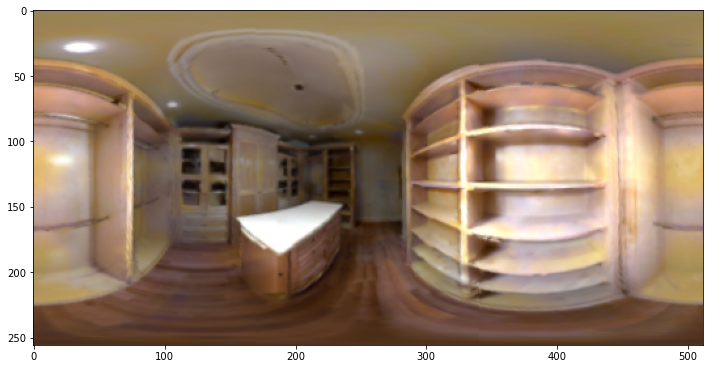

In [132]:
img_erp_int = img_erp[0].permute(1, 2, 0).numpy()
img_erp_int = img_erp_int * 255
img_erp_int = img_erp_int[:,:,[2,1,0]].astype(np.uint8)
plt.figure(figsize=(12, 12))
plt.imshow(img_erp_int, aspect=1)
plt.show()

In [133]:
ssim_noise = ssim(img, img_erp_int, multichannel=True)
print(ssim_noise)
mse_noise = mean_squared_error(img, img_erp_int)
print(mse_noise)

0.7599553326249948
1815.7714284261067
